# MassiveOES fits Specair 

An example where we use [MassiveOES](https://bitbucket.org/OES_muni/massiveoes) to fit a N2C non-LTE spectrum originally computed by [Specair](http://www.specair-radiation.net/)

In [35]:
import massiveOES
from plotly.offline import iplot, init_notebook_mode
from plotly.graph_objects import FigureWidget, Scatter
from IPython.display import display, clear_output
init_notebook_mode()
import ipywidgets as widgets
import os

# Browse the measured spectra 

The Specair spectrum is made available as one of the RADIS test files. Of course, the spectrum calculation conditions lie in the spectrum name, but let's let MassiveOES find out by itself ! 

In [36]:
from radis import Spectrum
#s_exp = Spectrum.from_txt(getTestFile("calc_N2C_spectrum_Trot1200_Tvib3000_slit0.1.txt"), "radiance", wunit="nm", unit="mW/cm2/sr/µm")

from radis.test.utils import getTestFile
meas = massiveOES.MeasuredSpectra.from_CSV(getTestFile("calc_N2C_spectrum_Trot1200_Tvib3000_slit0.1.txt"),
                                   delimiter='\t')


In [37]:


first_specname = list(meas.spectra.keys())[0]
spectrum_selector = widgets.Dropdown(
    options= list(meas.spectra.keys()),
    value=first_specname,
    description='spectrum:',
    disabled=False,
)

def update_first_plot(change):
    measspec = meas.get_measured_spectrum(spectrum_selector.value)
    with first_graph.batch_update():
        first_graph.data[0].x = measspec.x
        first_graph.data[0].y = measspec.y

spectrum_selector.observe(update_first_plot, names='value')

measspec = meas.get_measured_spectrum(first_specname)
meas_trace = Scatter(x = measspec.x, y = measspec.y, name = 'measured')


first_graph = FigureWidget(data = [meas_trace])

vbox = widgets.VBox([spectrum_selector, first_graph])


Set the "spectrum" dropdown menu to the spectrum with the best observable signal.

In [38]:
display(vbox)

    'data': [{'name': …

# Fix wavelength offset

Select relevant molecular transitions that you observe in your spectra by removing the `#` sign:

In [39]:
transitions = [
    #'C2_swan.db',
    'N2CB.db',
    #'N2PlusBX.db'
    #'NHAX.db',
    #'NOBX.db'
    #'OHAX.db',
]

specname = spectrum_selector.value #work with the spectrum selected by the dropdown menu above
for transition in transitions:
    db = massiveOES.SpecDB(transition)
    meas.add_specie(db, specname)

def update_spectra(specname, shift=0):
    measspec = meas.get_measured_spectrum(specname)
    measspec.x += shift
    simspec = massiveOES.puke_spectrum(
            meas.spectra[specname]['params'],
            step = meas.spectra[specname]['params']['wav_step'].value,
            sims = meas.simulations
    )
    simspec.y /= max(simspec.y)
    simspec.y *= max(measspec.y)
    residuals = massiveOES.spectrum.compare_spectra(measspec,
                                                    simspec)
    return measspec, simspec, residuals
    

measspec, simspec, residuals = update_spectra(specname)


meas_trace = Scatter(x = measspec.x, y = measspec.y, name = 'measured')
sim_trace = Scatter(x = simspec.x, y = simspec.y, name = 'simulated', opacity = 0.8)
res_trace = Scatter(x = measspec.x, y = residuals, name = 'residuals', opacity = 0.6)


shift_graph = FigureWidget(data = [meas_trace, sim_trace, res_trace])

broadening_box = widgets.FloatText(
    value=1e-2,
    description='broadening:',
    disabled=False,
    step=0.01,
    min = 1e-9
)

wav_shift_box = widgets.FloatText(
    value=0,
    description=' λ-shift [nm]:',
    disabled=False,
    step=0.01,
    min = -2,
    max=2
)

def update_shift_plot(change):
    meas.spectra[specname]['params']['slitf_gauss'].value = broadening_box.value/2
    meas.spectra[specname]['params']['slitf_lorentz'].value = broadening_box.value/2
    measspec, simspec, residuals = update_spectra(specname, wav_shift_box.value)
    with shift_graph.batch_update():
        shift_graph.data[0].x = measspec.x
        shift_graph.data[0].y = measspec.y
        shift_graph.data[1].x = simspec.x
        shift_graph.data[1].y = simspec.y
        shift_graph.data[2].x = measspec.x
        shift_graph.data[2].y = residuals

broadening_box.observe(update_shift_plot, names='value')
wav_shift_box.observe(update_shift_plot, names='value')
w_out = widgets.Output()

hbox = widgets.HBox([wav_shift_box, broadening_box])
vbox = widgets.VBox([hbox, shift_graph])


Minimize the residuals by changing the wavelength shift and the line-broadening parameter.

In [40]:
display(vbox)

When you feel like you cannot improve the result anymore, you can try to fit the rest of the parameters automatically.  

# First fit 

In [45]:
def fit(specname):
    meas.spectra[specname]['params']['slitf_gauss'].min = 0
    meas.spectra[specname]['params']['slitf_lorentz'].min = 0
    meas.spectra[specname]['params']['slitf_gauss'].value = broadening_box.value/2
    meas.spectra[specname]['params']['slitf_lorentz'].value = broadening_box.value/2
    meas.spectra[specname]['params']['wav_start'].value = meas.spectra[specname]['params']['wav_start'].init_value + wav_shift_box.value
    meas.fit(specname)

fit(specname)

measspec, simspec, residuals = update_spectra(specname)
meas_trace = Scatter(x = measspec.x, y = measspec.y, name = 'measured')
sim_trace = Scatter(x = simspec.x, y = simspec.y, name = 'simulated', opacity = 0.8)
res_trace = Scatter(x = measspec.x, y = residuals, name = 'residuals', opacity = 0.6)


********* specname =  1  ************
📈 Fit results:
<Parameter 'N2CB_Trot', value=1203.93053490338, bounds=[300:10000]>
<Parameter 'N2CB_Tvib', value=3042.1542214299548, bounds=[300:10000]>


Now, we should inspect the result of the fit.

If the fit doesn't look good, you should repeat the procedure from the beginning. 

Typical reasons for fit failure include:
 1. **Missing the necessary spectral databases.** You can try to uncomment other relevant molecular transitions and see if the fit improves. If you are convinced that you need a molecular transition that is not available in the list, you need to create the specral database yourself. In that case, don't even try to fit, the result would be wrong.
 2. **Wrong wavelength calibration.** Typically, adjusting a constant offset in wavelengths is sufficent and the fit usually succeds in fine-tuning the wavelength calibration. In special cases, particularly spectra glued from multiple spectral windows or echelle spectrometers, the whole procedure of wavelenght fitting must be reconsidired. This scenario is, unfortunatelly, not implemented.
 3. **Wrong broadening function.** The broadening of the lines should be visually very similar. A factor-of-two error in this parameter usually results in wrong results.

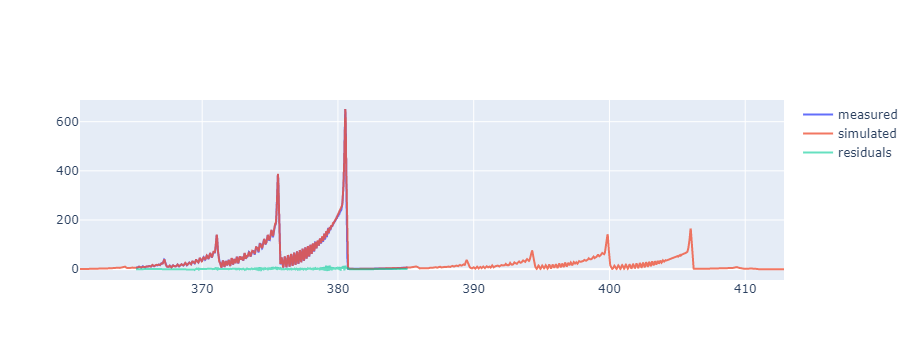

In [ ]:
iplot({'data':[meas_trace, sim_trace, res_trace]})

Let's see what fit results we got : 

In [47]:

print(meas.spectra[specname]['params']["N2CB_Trot"])
print(meas.spectra[specname]['params']["N2CB_Tvib"])

<Parameter 'N2CB_Trot', value=1203.93053490338, bounds=[300:10000]>
<Parameter 'N2CB_Tvib', value=3042.1542214299548, bounds=[300:10000]>


So very close to the original spectrum, Trot = 1200 K ; Tvib = 3000 K ! 👏 